<a href="https://colab.research.google.com/github/OscarPellicer/extra-attributions/blob/main/Captum_Quantus_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Captum + Quantus + FusionGrad


Install all required libraries

In [1]:
#https://github.com/chmp/ipytest/issues/80
import sys
sys.breakpointhook = sys.__breakpointhook__

In [2]:
import os

#Example images
!wget -P ./xai_assets https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json
!wget -P ./xai_assets https://modernfarmer.com/wp-content/uploads/2021/05/shutterstock_339099548.jpg
!wget -P ./xai_assets https://cdn.pixabay.com/photo/2018/04/07/20/32/swan-3299528_1280.jpg
!wget -P ./xai_assets https://www.shetzers.com/wp-content/uploads/2018/02/Magpie-watches-bald-eagle-eat-salmon-20121119-132024.jpg

#If running from collab, install everything the cheapo way
if os.getenv("COLAB_RELEASE_TAG"):
    !pip install torch torchvision captum quantus lovely_tensors quantus
    # !pip install "matplotlib<3.7"
    # !pip install quantus

    !pip install git+https://github.com/OscarPellicer/txyvis.git
    !pip install git+https://github.com/OscarPellicer/tiled_occlusion.git

--2025-10-13 16:43:03--  https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json
Resolving s3.amazonaws.com (s3.amazonaws.com)... 54.231.169.8, 54.231.161.144, 52.217.113.104, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|54.231.169.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35363 (35K) [application/octet-stream]
Saving to: ‘./xai_assets/imagenet_class_index.json.1’

imagenet_class_inde 100%[===================>]  34.53K  --.-KB/s    in 0.002s  

2025-10-13 16:43:03 (16.8 MB/s) - ‘./xai_assets/imagenet_class_index.json.1’ saved [35363/35363]

--2025-10-13 16:43:03--  https://modernfarmer.com/wp-content/uploads/2021/05/shutterstock_339099548.jpg
Resolving modernfarmer.com (modernfarmer.com)... 104.21.71.61, 172.67.169.253, 2606:4700:3037::6815:473d, ...
Connecting to modernfarmer.com (modernfarmer.com)|104.21.71.61|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 66792 (65K) [image/jpeg]
Savin

Load libraries

In [3]:
import torch
import torch.nn.functional as F

from PIL import Image
from pathlib import Path
import os
import json
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

import torchvision
from torchvision import models, transforms

from captum.attr import IntegratedGradients, Saliency, GradientShap, Occlusion, NoiseTunnel, visualization as viz

import lovely_tensors as lt
lt.monkey_patch()

Create a function for visualization of images along attributions using my custom library `txyvis`

In [4]:
# Visualize attributions using my custom visualization library
from txyvis import plot_maps

#Create colormap for attribution plotting and register it
import matplotlib as mpl
import matplotlib.pyplot as plt

try:
    c = ["darkred","red","lightcoral","white", "palegreen","green","darkgreen"]
    v = np.array([0,.15,.4,.5,0.6,.9,1.])
    cmap= mpl.colors.LinearSegmentedColormap.from_list('RdGn', list(zip(v,c)), N=256)
    mpl.colormaps.register(cmap, name='RdGn')
except Exception as e:
    print(e)

# We create a function for convenience
def plot_attributions(image, attributions=[], attribution_names=[], limits=None, title=None, figsize=4):
    return plot_maps(
      images=[image[None].flip(dims=[-1,-2]).transpose(-1,-2)] +\
             [attr.mean(axis=1, keepdim=True).flip(dims=[-1,-2]).transpose(-1,-2)
              for attr in attributions],
      cmaps=[None] + ['RdGn']*len(attribution_names),
      centers= [False] + [True]*len(attribution_names),
      ylabels=['Input'] + attribution_names,
      limits= [None] + ([limits]*len(attribution_names) if isinstance(limits, tuple) or limits is None else limits),
      transpose=True, figsize=figsize, title=title)

Open ImageNet labels, load model, move to GPU

In [5]:
labels_path = './xai_assets/imagenet_class_index.json'
with open(labels_path) as json_data:
    idx_to_labels = json.load(json_data)

In [6]:
# Enable GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f'Using {device=}')

#See full model list @ https://pytorch.org/vision/stable/models.html
def getCNN():
    #Get pretrained ImageNet CNN
    # model = models.resnet18(pretrained=True) #acc@1 69.758 | acc@5 89.078 | params 11.7M | GFLOPS 1.81
    # model = models.efficientnet_b3(pretrained=True) #82.008 | 96.054 | 12.2M | 1.83
    model = models.efficientnet_b0(pretrained=True) #	77.69 | 93.532 | 5.3M | 0.39
    model = model.eval().to(device)
    print(f'Using: {model.__class__}')
    return model

model= getCNN()

Using device=device(type='cpu')
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 20.5M/20.5M [00:00<00:00, 128MB/s]


Using: <class 'torchvision.models.efficientnet.EfficientNet'>


## Get sample image & predict class with EfficientNet

tensor[1, 3, 224, 224] n=150528 (0.6Mb) x∈[-2.118, 2.361] μ=0.208 σ=1.291


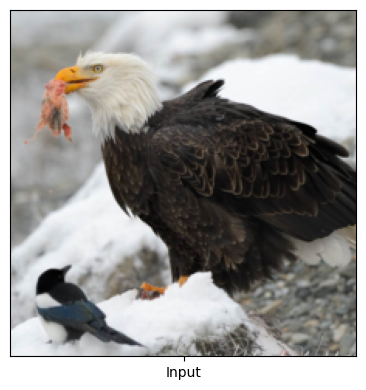

(<Figure size 400x400 with 1 Axes>, <Axes: >)

In [7]:
#Get sample image
# img = Image.open('./xai_assets/swan-3299528_1280.jpg')
# img = Image.open('./xai_assets/shutterstock_339099548.jpg')
img = Image.open('./xai_assets/Magpie-watches-bald-eagle-eat-salmon-20121119-132024.jpg')

transform = transforms.Compose([
 transforms.Resize(256),
 transforms.CenterCrop(224),
 transforms.ToTensor()
])

imagenet_mean, imagenet_std= [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
transform_normalize = transforms.Normalize(mean=imagenet_mean, std=imagenet_std)

transformed_img = transform(img).to(device)
input = transform_normalize(transformed_img)
input = input.unsqueeze(0)

#Plot image
print(input) #Nice representation thanks to lovely_tensors
plot_attributions(transformed_img) #Using my custom function

In [8]:
output = model(input)
output = F.softmax(output, dim=1)
prediction_scores, pred_label_idxs = torch.topk(output, 50)

for k, (prediction_score, pred_label_idx) in list(enumerate(zip(prediction_scores.squeeze_(),
                                                                pred_label_idxs.squeeze_()))):
    predicted_label = idx_to_labels[str(pred_label_idx.item())][1]
    print(f' - {k}: {prediction_score.squeeze().item()*100 : 2.2f}%: {predicted_label}')

 - 0:  75.93%: bald_eagle
 - 1:  1.12%: vulture
 - 2:  0.73%: albatross
 - 3:  0.31%: kite
 - 4:  0.25%: hornbill
 - 5:  0.16%: white_stork
 - 6:  0.15%: black_swan
 - 7:  0.13%: goose
 - 8:  0.13%: oystercatcher
 - 9:  0.12%: hen
 - 10:  0.11%: black_grouse
 - 11:  0.11%: ruddy_turnstone
 - 12:  0.11%: rock_crab
 - 13:  0.10%: king_crab
 - 14:  0.10%: limpkin
 - 15:  0.09%: black_stork
 - 16:  0.09%: water_ouzel
 - 17:  0.08%: pelican
 - 18:  0.08%: ostrich
 - 19:  0.07%: Irish_water_spaniel
 - 20:  0.07%: wreck
 - 21:  0.07%: fiddler_crab
 - 22:  0.06%: magpie
 - 23:  0.06%: accordion
 - 24:  0.06%: pole
 - 25:  0.06%: sports_car
 - 26:  0.06%: European_gallinule
 - 27:  0.06%: African_hunting_dog
 - 28:  0.06%: Brittany_spaniel
 - 29:  0.06%: obelisk
 - 30:  0.06%: bow_tie
 - 31:  0.06%: cock
 - 32:  0.05%: ashcan
 - 33:  0.05%: green_lizard
 - 34:  0.05%: scorpion
 - 35:  0.05%: anemone_fish
 - 36:  0.05%: curly-coated_retriever
 - 37:  0.05%: hot_pot
 - 38:  0.05%: velvet
 - 39:  

In [9]:
# Get the indices for the classes of interest
# labels_to_idx = {v[1]: k for k, v in idx_to_labels.items()}
class_to_position = {idx_to_labels[str(i.item())][1]: k for k, i in enumerate(pred_label_idxs.squeeze())}

pred_label_idx_rooster= pred_label_idxs.squeeze_()[int(class_to_position['cock'])]
pred_label_idx_hen= pred_label_idxs.squeeze_()[int(class_to_position['hen'])]

pred_label_idx_eagle= pred_label_idxs.squeeze_()[int(class_to_position['bald_eagle'])]
pred_label_idx_magpie= pred_label_idxs.squeeze_()[int(class_to_position['magpie'])]

# Choose what we are predicting
pred_label_idx= pred_label_idx_eagle

predicted_label = idx_to_labels[str(pred_label_idx.item())][1]
print(pred_label_idx, predicted_label)

tensor i64 22 bald_eagle


## Compute Integrated Gradients attribution

/usr/local/lib/python3.12/dist-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)


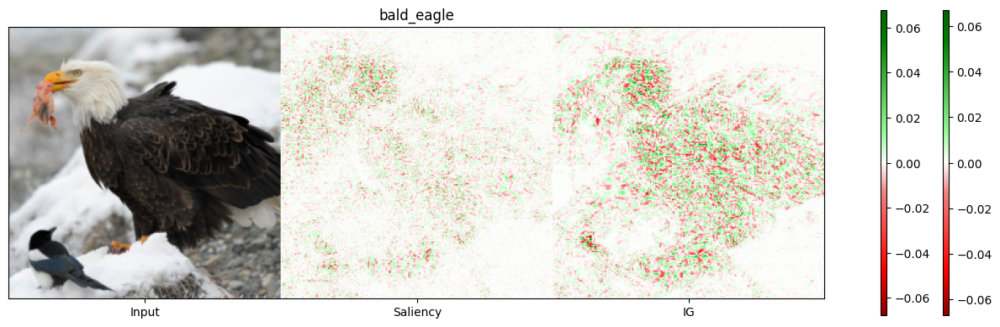

In [10]:
#Attribute with IG
integrated_gradients = IntegratedGradients(model)
attributions_ig = integrated_gradients.attribute(input, target=pred_label_idx, n_steps=20).cpu().detach()

#Attribute with Saliency
attributions_s = Saliency(model).attribute(input, abs=False, target=pred_label_idx).cpu().detach()

#Plot
plot_attributions(transformed_img, [attributions_s, attributions_ig], ['Saliency', 'IG'],
                  title=predicted_label);

#For reference, this is the captum way of plotting attributions
#But we will be using my function, which allows for comparison of different methods
# _ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
#                              np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
#                              methods= ["original_image", "heat_map"],
#                              signs=  ["all", "all"], titles=[f'{predicted_label}', f'IG'],
#                              show_colorbar=True, outlier_perc=1)

## Saliency (aka Gradient), InputXGradient, GradientSHAP

In [11]:
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Using: <class 'torchvision.models.efficientnet.EfficientNet'>


/usr/local/lib/python3.12/dist-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/usr/local/lib/python3.12/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:63: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/usr/local/lib/python3.12/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:66: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)


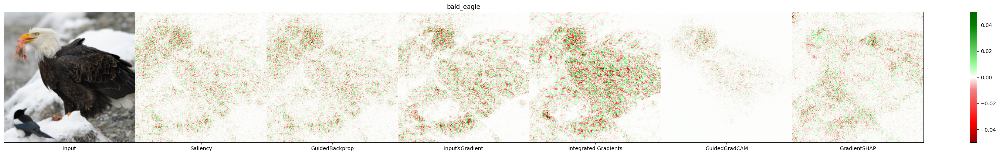

In [12]:
from captum.attr import Saliency, InputXGradient, GradientShap, GuidedGradCam, GuidedBackprop
model= getCNN() #Reset CNN just in case

#Saliency
saliency= Saliency(model)
attributions_sal= saliency.attribute(input, target=pred_label_idx, abs=False).cpu().detach()

#GuidedBackprop
gbp = GuidedBackprop(model)
attributions_gbp = gbp.attribute(input, target=pred_label_idx).cpu().detach()

#InputxGradient
ixg = InputXGradient(model)
attributions_ixg= ixg.attribute(input, target=pred_label_idx).cpu().detach()

#IntegratedGradients
integrated_gradients = IntegratedGradients(model)
attributions_ig = integrated_gradients.attribute(input, target=pred_label_idx, n_steps=100).cpu().detach()

#GradientSHAP
gradient_shap= GradientShap(model)
baselines= torch.randn(50, *transformed_img.shape).to(device)
attributions_gradshap= gradient_shap.attribute(input, baselines, target=pred_label_idx).cpu().detach()

#Guided GradCAM
guided_gc = GuidedGradCam(model, model.features[-1])
attributions_ggc= guided_gc.attribute(input, target=pred_label_idx,
                                      interpolate_mode='bilinear',
                                      attribute_to_layer_input=False).cpu().detach()

#Plot
attrs_to_plot = [attributions_sal, attributions_gbp, attributions_ixg, attributions_ig, attributions_ggc, attributions_gradshap]
attrs_name = ['Saliency', 'GuidedBackprop', 'InputXGradient', 'Integrated Gradients', 'GuidedGradCAM', 'GradientSHAP']
plot_attributions(transformed_img, attrs_to_plot, attrs_name,
                  limits=(-0.05, 0.05), title=predicted_label);

## Integrated Gradients / NoiseGrad / FusionGrad

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Using: <class 'torchvision.models.efficientnet.EfficientNet'>


/usr/local/lib/python3.12/dist-packages/captum/attr/_utils/batching.py:51: UserWarning: Internal batch size cannot be less than the number of input examples. Defaulting to internal batch size of 25 equal to the number of examples.
  warnings.warn(


FusionGrad:   0%|          | 0/25 [00:00<?, ?it/s]

FusionGrad:   0%|          | 0/25 [00:00<?, ?it/s]

FusionGrad:   0%|          | 0/25 [00:00<?, ?it/s]

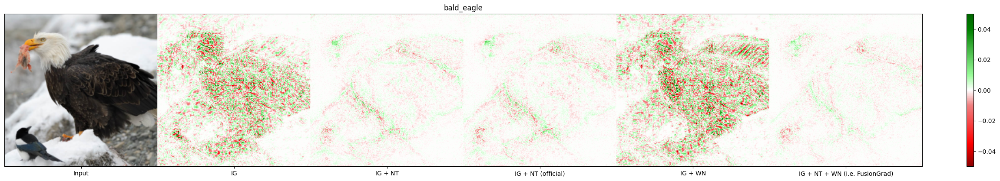

In [13]:
from extra_attributions import TiledOcclusion, FusionGrad

#Get the explainer
model= getCNN() #Reset CNN just in case
integrated_gradients = IntegratedGradients(model)
fusiongrad= FusionGrad(integrated_gradients, model=model)

# Equivalent code using official captum's NoiseTunnel implementation
noise_tunnel = NoiseTunnel(integrated_gradients)
attributions_ig_nt = noise_tunnel.attribute(input, nt_samples=25, nt_type='smoothgrad',
                                  target=pred_label_idx, stdevs=1.5, internal_batch_size=5).cpu().detach()

#IG + NT: Let's just use NoiseTunnel (aka NoiseGrad): Add noise to the inputs
#We must set std=0 and n=1 to disable FusionGrad, and use NoiseTunnel only
attributions_ig_nt2= fusiongrad.attribute(input, target=pred_label_idx,
                            std=0., mean=1., n=1, additive_noise=True, #Weight noise
                            sg_std=1.5, m=25, sg_additive_noise=True, #Input noise
                                         ).cpu().detach()

#IG + WN: Let's try Weight Noise: Add noise to the weights
attributions_ig_wn= fusiongrad.attribute(input, target=pred_label_idx,
                            std=0.005, mean=1., n=25, additive_noise=False, #Weight noise (mult)
                            # std=0.01, mean=0., n=25, additive_noise=True, #Weight noise (add)
                            sg_std=0., m=1, sg_additive_noise=True, #Input noise
                                         ).cpu().detach()

# #IG + NT + WN: Let's try with FusionGrad: Add noise to inputs AND weights
attributions_ig_fg= fusiongrad.attribute(input, target=pred_label_idx,
                            std=0.005, mean=1., n=5, additive_noise=False, #Weight noise (mult)
                            sg_std=1.5, m=5, sg_additive_noise=True, #Input noise
                                         ).cpu().detach()

#Plot
plot_attributions(transformed_img,
  [attributions_ig, attributions_ig_nt, attributions_ig_nt2, attributions_ig_wn, attributions_ig_fg],
  ['IG', 'IG + NT', 'IG + NT (official)', 'IG + WN', 'IG + NT + WN (i.e. FusionGrad)'],
  title=predicted_label, limits=(-0.05, 0.05));

### Other methods + NT

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Using: <class 'torchvision.models.efficientnet.EfficientNet'>


/usr/local/lib/python3.12/dist-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/usr/local/lib/python3.12/dist-packages/captum/attr/_utils/batching.py:51: UserWarning: Internal batch size cannot be less than the number of input examples. Defaulting to internal batch size of 10 equal to the number of examples.
  warnings.warn(


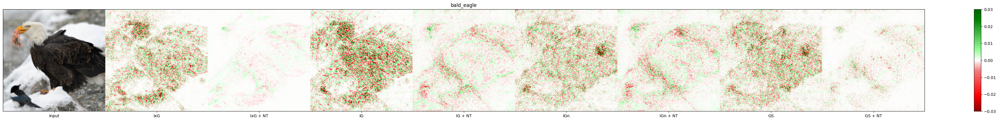

In [14]:
#Explain
model= getCNN() #Reset CNN just in case
random_tensor = torch.normal(mean=input.mean(), std=input.std()*0.5, size=input.shape).to(input.device)

#Input x Gradient
inputxgradient = InputXGradient(model)
attributions_ixg = inputxgradient.attribute(input, target=pred_label_idx).cpu().detach()

noise_tunnel_ixg = NoiseTunnel(inputxgradient)
attributions_ixg_nt = noise_tunnel_ixg.attribute(input, nt_samples=100, nt_type='smoothgrad',
                                  target=pred_label_idx, stdevs=1.5).cpu().detach()

#Integrated Gradients
integrated_gradients = IntegratedGradients(model)
zeros_tensor = torch.zeros_like(input)
attributions_ig = integrated_gradients.attribute(input, n_steps=100, target=pred_label_idx,
                                                baselines=zeros_tensor).cpu().detach()

noise_tunnel_ig = NoiseTunnel(integrated_gradients)
attributions_ig_nt = noise_tunnel_ig.attribute(input, nt_samples=10, n_steps=10, nt_type='smoothgrad',
                                  target=pred_label_idx, stdevs=1.5, internal_batch_size=2).cpu().detach()

#Integrated Gradients with noisy baseline
attributions_ign = integrated_gradients.attribute(input, n_steps=100, target=pred_label_idx,
                                                baselines=random_tensor).cpu().detach()

noise_tunnel_ig = NoiseTunnel(integrated_gradients)
attributions_ign_nt = noise_tunnel_ig.attribute(input, nt_samples=10, n_steps=10, nt_type='smoothgrad',
                                  target=pred_label_idx, stdevs=1.5, internal_batch_size=2).cpu().detach()

#GradientSHAP
gradient_shap= GradientShap(model)
attributions_gradshap= gradient_shap.attribute(input, random_tensor, target=pred_label_idx).cpu().detach()

noise_tunnel_gs = NoiseTunnel(gradient_shap)
attributions_gradshap_nt = noise_tunnel_gs.attribute(input, baselines=random_tensor,
                                 nt_samples=10, nt_type='smoothgrad',
                                  target=pred_label_idx, stdevs=1.5).cpu().detach()

#Plot
plot_attributions(transformed_img,
  [attributions_ixg, attributions_ixg_nt, attributions_ig, attributions_ig_nt,
   attributions_ign, attributions_ign_nt, attributions_gradshap, attributions_gradshap_nt],
  ['IxG', 'IxG + NT', 'IG', 'IG + NT', 'IGn', 'IGn + NT', 'GS', 'GS + NT'],
  title=predicted_label, limits=(-0.03, 0.03));

## Occlusion-based attribution

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Using: <class 'torchvision.models.efficientnet.EfficientNet'>


Occlusion attribution:   0%|          | 0/1445 [00:00<?, ?it/s]

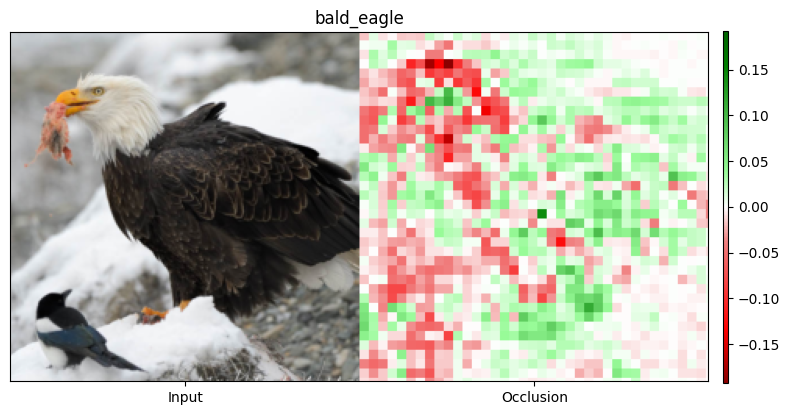

In [15]:
#Attribute
model= getCNN()
occlusion= Occlusion(model)
attributions_occ= occlusion.attribute(input, strides=(3,6,6), target=pred_label_idx,
                    sliding_window_shapes=(3,6,6), baselines=0, show_progress=True).cpu().detach()

#Plot
plot_attributions(transformed_img, [attributions_occ], ['Occlusion'], title=predicted_label);

## Tiled occlusion-based attribution

/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:48: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /pytorch/torch/csrc/autograd/python_variable_indexing.cpp:306.)
  padded_input.__setitem__(padded_indexer, input)
TiledOcclusion:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:57: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /pytorch/torch/csrc/autograd/python_v

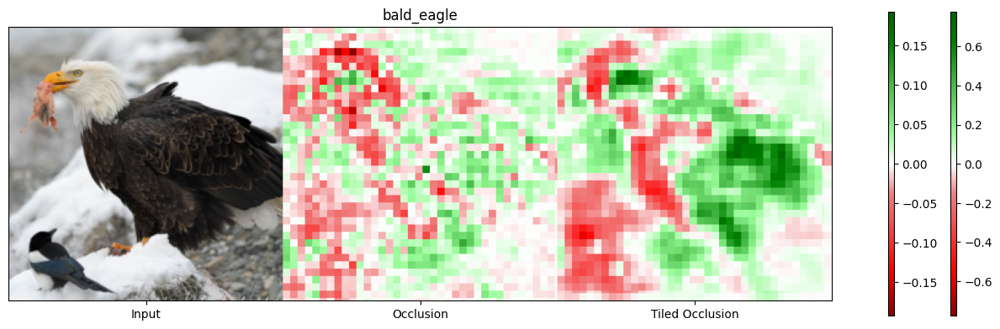

In [16]:
#Attribute and plot
tiled_occlusion= TiledOcclusion(model)
attributions_tocc= tiled_occlusion.attribute(input, target=pred_label_idx,
                                             k=[1,2,2], window= [3,12,12]).cpu().detach()
plot_attributions(transformed_img, [attributions_occ, attributions_tocc],
                  ['Occlusion', 'Tiled Occlusion'], title=predicted_label);

## Occlusion + NoiseTunnel

/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:48: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /pytorch/torch/csrc/autograd/python_variable_indexing.cpp:306.)
  padded_input.__setitem__(padded_indexer, input)
TiledOcclusion:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:57: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /pytorch/torch/csrc/autograd/python_v

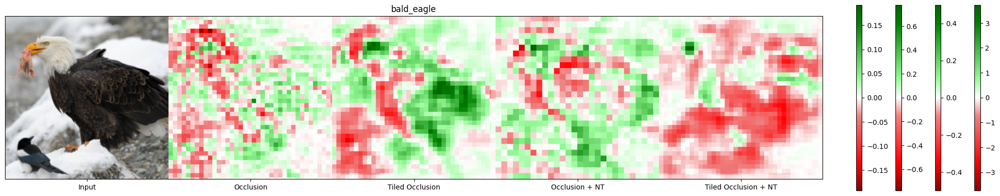

In [17]:
from extra_attributions import TiledOcclusion

#Attribute and plot
noise_tunnel_occ = NoiseTunnel(occlusion)
attributions_occ_nt = noise_tunnel_occ.attribute(input, nt_samples=6, nt_type='smoothgrad',
                        target=pred_label_idx, stdevs=.5,
                        strides=(3,8,8), sliding_window_shapes=(3,8,8), baselines=0).cpu().detach()

tiled_occlusion= TiledOcclusion(model)
noise_tunnel_tocc = NoiseTunnel(tiled_occlusion)
attributions_tocc_nt= noise_tunnel_tocc.attribute(input, target=pred_label_idx,
                                                  k=[1,2,2], window= [3,12,12]).cpu().detach()

plot_attributions(transformed_img, [attributions_occ, attributions_tocc, attributions_occ_nt, attributions_tocc_nt],
                  ['Occlusion', 'Tiled Occlusion', 'Occlusion + NT', 'Tiled Occlusion + NT'], title=predicted_label);

## DeeepLift, DeepLiftSHAP

/usr/local/lib/python3.12/dist-packages/captum/attr/_core/noise_tunnel.py:401: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  attributions = attr_func.__wrapped__(  # type: ignore
/usr/local/lib/python3.12/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:63: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/usr/local/lib/python3.12/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:66: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


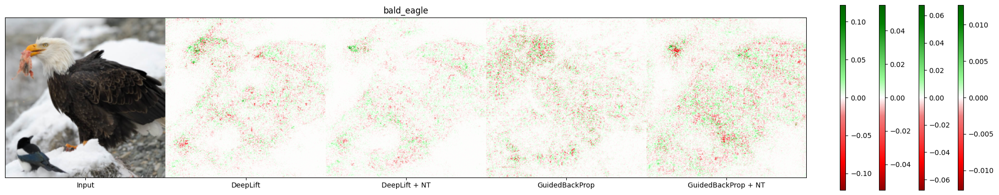

In [18]:
#Attribute and plot
from captum.attr import DeepLift, DeepLiftShap, LRP, GuidedBackprop
deep_lift= DeepLift(model)
noise_tunnel_dl = NoiseTunnel(deep_lift)
attributions_dl = noise_tunnel_dl.attribute(input, target=pred_label_idx)
attributions_dl_nt = noise_tunnel_dl.attribute(input, nt_samples=10, nt_type='smoothgrad',
                        target=pred_label_idx, stdevs=1.5).cpu().detach()

#Guided Backprop
gbp = GuidedBackprop(model)
noise_tunnel_gbp = NoiseTunnel(gbp)
attributions_gbp = gbp.attribute(input, target=pred_label_idx)
attributions_gbp_nt = noise_tunnel_gbp.attribute(input, nt_samples=10, nt_type='smoothgrad',
                        target=pred_label_idx, stdevs=1.5).cpu().detach()

plot_attributions(transformed_img,
  [attributions_dl, attributions_dl_nt, attributions_gbp, attributions_gbp_nt],
  ['DeepLift', 'DeepLift + NT', 'GuidedBackProp', 'GuidedBackProp + NT'], title=predicted_label);

## LRP

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Using: <class 'torchvision.models.efficientnet.EfficientNet'>


/usr/local/lib/python3.12/dist-packages/captum/attr/_core/lrp.py:207: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(input_tuple)


tensor[1, 3, 224, 224] n=150528 (0.6Mb) x∈[-6.556e+12, 6.263e+12] μ=-1.513e+08 σ=6.618e+10 grad MulBackward0 tensor[1, 3, 224, 224] n=150528 (0.6Mb) x∈[-6.434e+10, 1.531e+10] μ=-6.131e+06 σ=4.345e+08


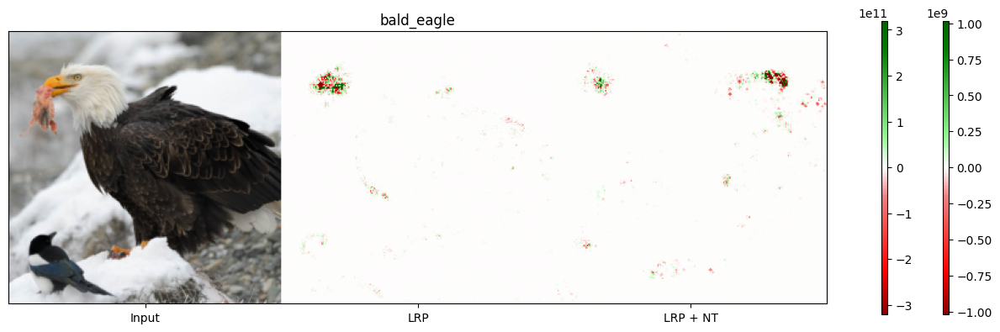

In [19]:
from captum.attr import LRP
from captum.attr._utils.lrp_rules import EpsilonRule, IdentityRule, PropagationRule, GammaRule, Alpha1_Beta0_Rule
from captum.attr._utils.custom_modules import Addition_Module
import torch.nn as nn
from torchvision.ops import StochasticDepth

#Define rules where we can control the epsilon and gamma
#(which are fixed and hidden away by default)
class CustomZRule(PropagationRule):
    def __init__(self) -> None:
        super().__init__()
    def _manipulate_weights(self, module, inputs, outputs):
        pass

class CustomEpsilonRule(PropagationRule):
    def __init__(self, epsilon=0.25) -> None:
        super().__init__()
        self.STABILITY_FACTOR = epsilon
    def _manipulate_weights(self, module, inputs, outputs):
        pass

class CustomGammaRule(GammaRule):
    def __init__(self, gamma=.25, epsilon=0.25) -> None:
        super().__init__()
        self.gamma = gamma
        self.STABILITY_FACTOR = epsilon

#Fix a problem with tensor device placement for IdentityRule
class DeviceSafeIdentityRule(IdentityRule):
    def forward_hook(self, module, inputs, outputs):
        # Initialize relevance_output if it doesn't exist
        if not hasattr(self, 'relevance_output') or not self.relevance_output:
            self.relevance_output = {outputs.device: outputs.clone().detach()}
        else:
            # Move existing relevance to the correct device
            device = outputs.device
            if device not in self.relevance_output:
                existing_device = next(iter(self.relevance_output.keys()))
                self.relevance_output[device] = self.relevance_output[existing_device].to(device)

# Update the dictionary of default rules
SUPPORTED_LAYERS_WITH_RULES = {
    nn.MaxPool1d: CustomEpsilonRule,
    nn.MaxPool2d: CustomEpsilonRule,
    nn.MaxPool3d: CustomEpsilonRule,
    nn.Conv2d: CustomEpsilonRule,  # This will be overridden based on layer depth
    nn.AvgPool2d: CustomEpsilonRule,
    nn.AdaptiveAvgPool2d: CustomEpsilonRule,
    nn.Linear: CustomZRule,  # Changed to Z-rule for fully connected
    nn.BatchNorm2d: CustomEpsilonRule,
    Addition_Module: CustomEpsilonRule,
    StochasticDepth: CustomEpsilonRule,
    nn.SiLU: Alpha1_Beta0_Rule,
    nn.Sigmoid: Alpha1_Beta0_Rule,
}

# Define the tuple of supported layers
SUPPORTED_LAYERS_WITH_RULES_tuple = tuple(SUPPORTED_LAYERS_WITH_RULES.keys())

#Use different rules depending on layer position along the model
def add_lrp_rules_by_depth(model):
    # Get all modules in order
    modules_list = list(model.modules())
    total_layers = len([m for m in modules_list if isinstance(m, (nn.Conv2d, nn.Linear))])

    current_layer = 0

    for module in model.modules():
        if isinstance(module, SUPPORTED_LAYERS_WITH_RULES_tuple):
            # For convolutional layers
            if isinstance(module, nn.Conv2d):
                if current_layer < total_layers // 3:  # Lower layers
                    module.rule = CustomGammaRule()
                else:  # Middle layers
                    module.rule = CustomEpsilonRule()
                current_layer += 1
            # For fully connected layers
            elif isinstance(module, nn.Linear):
                module.rule = CustomZRule()
            # For other supported layers, keep epsilon rule
            else:
                module.rule = SUPPORTED_LAYERS_WITH_RULES[type(module)]()
        else:
            pass
    return model

# Apply rules to the model
model= getCNN()
model= add_lrp_rules_by_depth(model)

#Build standard and NT version
lrp = LRP(model)
noise_tunnel_lrp = NoiseTunnel(lrp)

#Attribute with LRP
attributions_lrp = lrp.attribute(input, target=pred_label_idx)

#Attribute with LRP + NT
#Note that we need to reattach the LRP rules to the model's layers
add_lrp_rules_by_depth(model)
attributions_lrp_nt = noise_tunnel_lrp.attribute(input, nt_samples=25, nt_type='smoothgrad',
                        target=pred_label_idx, stdevs=1.5)

#Check for nans or infs
print(attributions_lrp, attributions_lrp_nt)

# Calculate percentile limits for plotting
limit_lrp = (torch.quantile(attributions_lrp.flatten(), 0.001).item(),
             torch.quantile(attributions_lrp.flatten(), 0.999).item())
limit_lrp_nt = (torch.quantile(attributions_lrp_nt.flatten(), 0.001).item(),
                torch.quantile(attributions_lrp_nt.flatten(), 0.999).item())

#Plot
plot_attributions(transformed_img,
  [attributions_lrp, attributions_lrp_nt],
  ['LRP', 'LRP + NT'], title=predicted_label,
  limits=[limit_lrp, limit_lrp_nt]);

## Contrastive explanations

Create an explainer that attributes the output class wrt the average of all the other classes (or a single negative target, if provided)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Using: <class 'torchvision.models.efficientnet.EfficientNet'>


/usr/local/lib/python3.12/dist-packages/captum/attr/_utils/batching.py:51: UserWarning: Internal batch size cannot be less than the number of input examples. Defaulting to internal batch size of 10 equal to the number of examples.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:48: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /pytorch/torch/csrc/autograd/python_variable_indexing.cpp:306.)
  padded_input.__setitem__(padded_indexer, input)
TiledOcclusion:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:57: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in py

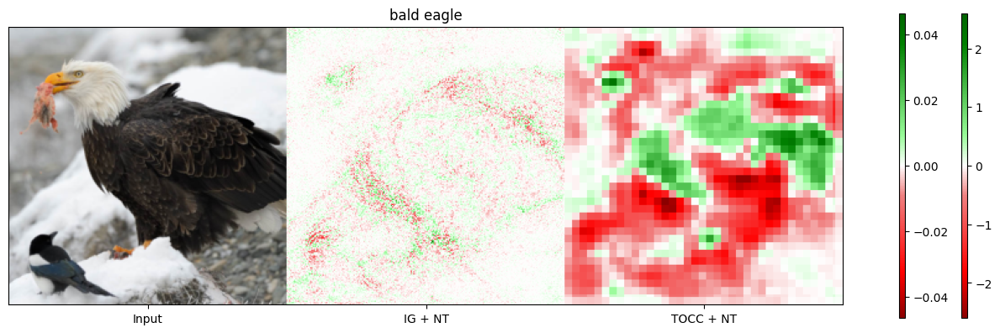

/usr/local/lib/python3.12/dist-packages/captum/attr/_utils/batching.py:51: UserWarning: Internal batch size cannot be less than the number of input examples. Defaulting to internal batch size of 10 equal to the number of examples.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:48: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /pytorch/torch/csrc/autograd/python_variable_indexing.cpp:306.)
  padded_input.__setitem__(padded_indexer, input)
TiledOcclusion:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:57: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in py

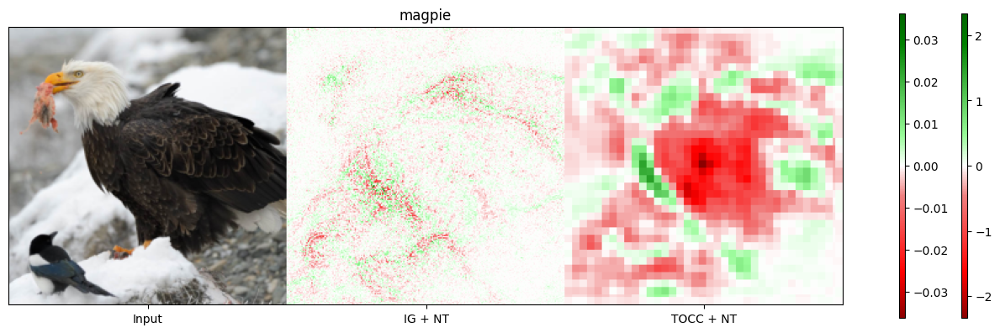

In [20]:
#Compare for the top 2 classes
model= getCNN() #Reset CNN just in case

# for label, idx in zip(['hen', 'rooster'], [pred_label_idx_hen, pred_label_idx_rooster]):
for label, idx in zip(['bald eagle', 'magpie'], [pred_label_idx_eagle, pred_label_idx_magpie]):

    #Integrated Gradients + NT
    integrated_gradients = IntegratedGradients(model)
    zeros_tensor = torch.zeros_like(input)
    noise_tunnel_ig = NoiseTunnel(integrated_gradients)
    attributions_ig_nt = noise_tunnel_ig.attribute(input, nt_samples=10, n_steps=10, nt_type='smoothgrad',
                                      target=idx, stdevs=1.5, internal_batch_size=5).cpu().detach()

    #Tile occlusion + NT
    tiled_occlusion= TiledOcclusion(model)
    noise_tunnel_tocc = NoiseTunnel(tiled_occlusion)
    attributions_tocc_nt= noise_tunnel_tocc.attribute(input, target=idx,
                                                  k=[1,2,2], window= [3,12,12]).cpu().detach()

    #Plot
    plot_attributions(transformed_img,
      [attributions_ig_nt, attributions_tocc_nt],
      ['IG + NT', 'TOCC + NT'],
      title=label);

/usr/local/lib/python3.12/dist-packages/captum/attr/_utils/batching.py:51: UserWarning: Internal batch size cannot be less than the number of input examples. Defaulting to internal batch size of 10 equal to the number of examples.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:48: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /pytorch/torch/csrc/autograd/python_variable_indexing.cpp:306.)
  padded_input.__setitem__(padded_indexer, input)
TiledOcclusion:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/extra_attributions/attribution.py:57: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in py

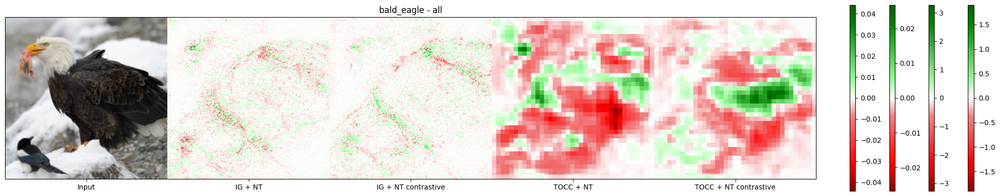

In [21]:
from extra_attributions import ContrastiveAttribution

#Use it
ig = IntegratedGradients(model)
contrastive_ig = ContrastiveAttribution(ig)
noise_tunnel_ig = NoiseTunnel(ig)
noise_tunnel_contrastive_ig = ContrastiveAttribution(noise_tunnel_ig)
noise_tunnel_tocc = NoiseTunnel(TiledOcclusion(model))
noise_tunnel_contrastive_tocc = ContrastiveAttribution(noise_tunnel_tocc)

attributions_ig_nt = noise_tunnel_ig.attribute(input, nt_samples=10, n_steps=10, nt_type='smoothgrad',
                                      stdevs=1.5, internal_batch_size=5,
                                      target=pred_label_idx).cpu().detach()
attributions_ig_nt_c = noise_tunnel_contrastive_ig.attribute(input, nt_samples=10, n_steps=10, nt_type='smoothgrad',
                                      stdevs=1.5, internal_batch_size=5,
                                      target=pred_label_idx).cpu().detach()
attributions_tocc_nt= noise_tunnel_tocc.attribute(input, target=pred_label_idx,
                                              k=[1,2,2], window= [3,12,12]).cpu().detach()
attributions_tocc_nt_c= noise_tunnel_contrastive_tocc.attribute(input, target=pred_label_idx,
                                              k=[1,2,2], window= [3,12,12]).cpu().detach()
plot_attributions(transformed_img,
      [attributions_ig_nt, attributions_ig_nt_c, attributions_tocc_nt, attributions_tocc_nt_c],
      [ 'IG + NT', 'IG + NT contrastive', 'TOCC + NT', 'TOCC + NT contrastive'],
      title=f'{predicted_label} - all');

## Evaluate the explainations using Quantus

In [50]:
import quantus

#GradientShap's baseline
baselines = torch.normal(mean=input.mean(), std=input.std()).to(input.device)

#Attribution methods
attrib_fns= {
        'LRP': lambda inputs, targets, model, device, **kwargs:
        LRP(add_lrp_rules_by_depth(model)).attribute(torch.tensor(inputs).to(device),
                target=torch.tensor(targets).to(device)).cpu().detach().numpy() / 1e30,
    'LRP + NT': lambda inputs, targets, model, device, **kwargs:
        NoiseTunnel(LRP(add_lrp_rules_by_depth(model))).attribute(torch.tensor(inputs).to(device),
                nt_samples=25, nt_type='smoothgrad',
                target=torch.tensor(targets).to(device)).cpu().detach().numpy() / 1e30,
     'Saliency': lambda inputs, targets, model, device, **kwargs:
        Saliency(model).attribute(torch.tensor(inputs).to(device),
                target=torch.tensor(targets).to(device), abs=False).cpu().detach().numpy(),
     'InputXGrad': lambda inputs, targets, model, device, **kwargs:
        InputXGradient(model).attribute(torch.tensor(inputs).to(device),
                target=torch.tensor(targets).to(device)).cpu().detach().numpy(),
     'IG': lambda inputs, targets, model, device, **kwargs:
        IntegratedGradients(model).attribute(torch.tensor(inputs).to(device),
                target=torch.tensor(targets).to(device), n_steps=20).cpu().detach().numpy(),
     'GradShap': lambda inputs, targets, model, device, **kwargs:
        GradientShap(model).attribute(torch.tensor(inputs).to(device), baselines,
                target=torch.tensor(targets).to(device)).cpu().detach().numpy(),
     'IG + NT': lambda inputs, targets, model, device, **kwargs:
        NoiseTunnel(IntegratedGradients(model)).attribute(torch.tensor(inputs).to(device),
                nt_samples=10, nt_type='smoothgrad',
                target=torch.tensor(targets).to(device), stdevs=1.5,
                internal_batch_size=5).cpu().detach().numpy(),
     'OCC': lambda inputs, targets, model, device, **kwargs:
        Occlusion(model).attribute(torch.tensor(inputs).to(device), strides=(3,12,12),
                target=torch.tensor(targets).to(device),
                sliding_window_shapes=(3,12,12), baselines=0, show_progress=True).cpu().detach().numpy(),
     'OCC + NT': lambda inputs, targets, model, device, **kwargs:
        NoiseTunnel(Occlusion(model)).attribute(torch.tensor(inputs).to(device),
                nt_samples=10, nt_type='smoothgrad', baselines=0,
                target=torch.tensor(targets).to(device),
                stdevs=1.5, strides=(3,12,12), sliding_window_shapes=(3,12,12)).cpu().detach().numpy()
        }

a_batch= torch.cat([attributions_ig, attributions_sal.detach(), attributions_ixg.detach(),
                    attributions_gradshap.detach(), attributions_ig_nt,
                    #expl_ng.repeat(3,1,1)[None].to(device), expl_ngp.repeat(3,1,1)[None].to(device),
                    attributions_occ, attributions_tocc, attributions_occ_nt], axis=0).cpu().numpy()
# x_batch= input.repeat(len(a_batch), 1,1,1).cpu().numpy()
# y_batch= pred_label_idx[None].repeat(len(a_batch),1,1,1).cpu().numpy()

#Attribution metrics
metrics = {
    "AvgSensitivity": quantus.AvgSensitivity(
        nr_samples=10,
        lower_bound=0.2,
        norm_numerator=quantus.norm_func.fro_norm,
        norm_denominator=quantus.norm_func.fro_norm,
        perturb_func=quantus.perturb_func.uniform_noise,
        similarity_func=quantus.similarity_func.difference,
        abs=False,
        normalise=False,
        aggregate_func=np.mean,
        return_aggregate=True,
        disable_warnings=True,
        perturb_func_kwargs={'indexed_axes': (1,)}, # Add this line
    ),
    "FaithfulnessCorrelation": quantus.FaithfulnessCorrelation(
        nr_runs=10,
        subset_size=224,
        perturb_baseline="black",
        perturb_func=quantus.perturb_func.baseline_replacement_by_indices,
        similarity_func=quantus.similarity_func.correlation_pearson,
        abs=False,
        normalise=False,
        aggregate_func=np.mean,
        return_aggregate=False,
        disable_warnings=True,
        perturb_func_kwargs={'indexed_axes': (1,)}, # Add this line
    ),
    "RandomLogit": quantus.RandomLogit(
        num_classes=1000,
        similarity_func=quantus.similarity_func.ssim,
        abs=False,
        normalise=False,
        aggregate_func=np.mean,
        return_aggregate=True,
        disable_warnings=True,
    ),
}

# metrics = {
#     # Complexity metrics
#     "Complexity - Sparseness": quantus.Sparseness(),
#     "Complexity - Complexity": quantus.Complexity(),

#     # Faithfulness metrics
#     "Faithfulness - FaithfulnessCorrelation": quantus.FaithfulnessCorrelation(
#         nr_runs=10,
#         subset_size=224,
#         perturb_baseline="black",
#         perturb_func=quantus.perturb_func.baseline_replacement_by_indices,
#         similarity_func=quantus.similarity_func.correlation_pearson,
#     ),
#     "Faithfulness - PixelFlipping": quantus.PixelFlipping(
#         perturb_baseline="uniform",
#         perturb_func=quantus.perturb_func.baseline_replacement_by_indices,
#     ),

#     # Localisation metrics
#     "Localisation - PointingGame": quantus.PointingGame(),
#     "Localisation - RelevanceMassAccuracy": quantus.RelevanceMassAccuracy(),

#     # Randomisation metrics
#     "Randomisation - RandomLogit": quantus.RandomLogit(
#         num_classes=1000,
#         similarity_func=quantus.similarity_func.ssim,
#     ),
#     "Randomisation - ModelParameterRandomisation": quantus.MPRT(),

#     # Robustness metrics
#     "Robustness - MaxSensitivity": quantus.MaxSensitivity(
#         nr_samples=10,
#         lower_bound=0.2,
#         norm_numerator=quantus.norm_func.fro_norm,
#         norm_denominator=quantus.norm_func.fro_norm,
#         perturb_func=quantus.perturb_func.uniform_noise,
#         similarity_func=quantus.similarity_func.difference,
#     ),
#     "Robustness - LocalLipschitzEstimate": quantus.LocalLipschitzEstimate(
#         nr_samples=10,
#         perturb_std=0.2,
#         perturb_mean=0.0,
#         norm_numerator=quantus.similarity_func.distance_euclidean,
#         norm_denominator=quantus.similarity_func.distance_euclidean,
#         perturb_func=quantus.perturb_func.gaussian_noise,
#         similarity_func=quantus.similarity_func.lipschitz_constant,
#     ),
# }

from collections import defaultdict
from tqdm.auto import tqdm

results = defaultdict(dict)
x = input.cpu().detach().numpy()
y = pred_label_idx.cpu().detach().numpy()

for a, (attribs_name, attribs_fn) in (bar1:= tqdm(zip(a_batch, attrib_fns.items()), total=len(attrib_fns))):
    for metric_name, metric in (bar2:=tqdm(metrics.items(), leave=False)):
        bar1.set_description(f'Attribution method: {attribs_name}')
        bar2.set_description(f'Metric name: {metric_name}')
        try:
          res = metric(x_batch=x, y_batch=y[None],
                      a_batch=a[None],
                      model=model, device=device, explain_func=attribs_fn)
          print(f' - {attribs_name} - {metric_name}: {res[0]:.4f}')
          results[metric_name][attribs_name] = res[0]
        except Exception as e:
          from traceback import format_exc
          print(format_exc())
          print(e)
          results[metric_name][attribs_name] = np.nan

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/captum/attr/_core/lrp.py:207: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(input_tuple)


 - LRP - AvgSensitivity: 1.0000
 - LRP - FaithfulnessCorrelation: 0.1843
 - LRP - RandomLogit: 0.5637


  0%|          | 0/3 [00:00<?, ?it/s]

 - LRP + NT - AvgSensitivity: 1.0000
 - LRP + NT - FaithfulnessCorrelation: 0.4033
 - LRP + NT - RandomLogit: 0.5669


  0%|          | 0/3 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)


 - Saliency - AvgSensitivity: 1.3322
 - Saliency - FaithfulnessCorrelation: 0.1327
 - Saliency - RandomLogit: 0.5191


  0%|          | 0/3 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)


 - InputXGrad - AvgSensitivity: 1.2819
 - InputXGrad - FaithfulnessCorrelation: -0.4001
 - InputXGrad - RandomLogit: 0.5781


  0%|          | 0/3 [00:00<?, ?it/s]

 - IG - AvgSensitivity: 3.3926
 - IG - FaithfulnessCorrelation: -0.3231
 - IG - RandomLogit: 0.4468


  0%|          | 0/3 [00:00<?, ?it/s]

Traceback (most recent call last):
  File "/tmp/ipython-input-3266162444.py", line 151, in <cell line: 0>
    res = metric(x_batch=x, y_batch=y[None],
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/quantus/metrics/robustness/avg_sensitivity.py", line 282, in __call__
    return super().__call__(
           ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/quantus/metrics/base.py", line 291, in __call__
    result = self.evaluate_batch(**data_batch)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/quantus/metrics/robustness/avg_sensitivity.py", line 348, in evaluate_batch
    a_perturbed = self.explain_batch(model, x_perturbed, y_batch)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/quantus/metrics/base.py", line 927, in explain_batch
    a_batch = self.explain_func(
              ^^^^^^^^^^^^^^^^^^
  File "/tmp/ip

  0%|          | 0/3 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/captum/attr/_utils/batching.py:51: UserWarning: Internal batch size cannot be less than the number of input examples. Defaulting to internal batch size of 10 equal to the number of examples.
  warnings.warn(


 - IG + NT - AvgSensitivity: 1.0002
 - IG + NT - FaithfulnessCorrelation: -0.5385
 - IG + NT - RandomLogit: 0.1088


  0%|          | 0/3 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

 - OCC - AvgSensitivity: 1.4814
 - OCC - FaithfulnessCorrelation: -0.6354


Occlusion attribution:   0%|          | 0/362 [00:00<?, ?it/s]

 - OCC - RandomLogit: 0.1242


In [51]:
results

defaultdict(dict,
            {'AvgSensitivity': {'LRP': 1.0,
              'LRP + NT': 1.0,
              'Saliency': 1.332167136669159,
              'InputXGrad': 1.2819003224372865,
              'IG': 3.392568755149841,
              'GradShap': nan,
              'IG + NT': 1.0001575589179992,
              'OCC': 1.4813776016235352},
             'FaithfulnessCorrelation': {'LRP': 0.18434619903564453,
              'LRP + NT': 0.40334615111351013,
              'Saliency': 0.13268506526947021,
              'InputXGrad': -0.40013670921325684,
              'IG': -0.3230600953102112,
              'GradShap': -0.12294374406337738,
              'IG + NT': -0.538458526134491,
              'OCC': -0.6353781223297119},
             'RandomLogit': {'LRP': 0.5637231857533591,
              'LRP + NT': 0.5669395103483557,
              'Saliency': 0.5191266958008285,
              'InputXGrad': 0.5780718395832823,
              'IG': 0.4467655445104734,
              'GradShap': nan,


In [52]:
# results= {'AvgSensitivity': {'LRP': 1.6979550115389508,
#               'LRP + NT': 1.001346321284905,
#               'Saliency': 1.3117479518020803,
#               'InputXGrad': 1.2302658202676588,
#               'IG': 1.7817566506734601,
#               'GradShap': 1.021814652356704,
#               'IG + NT': 1.0001132339083108,
#               'OCC': 1.5113143478406723},
#              'FaithfulnessCorrelation': {'LRP': -0.25033302385879375,
#               'LRP + NT': 0.6064022662630404,
#               'Saliency': -0.48588422160528355,
#               'InputXGrad': -0.10939212416041183,
#               'IG': -0.27447111236572846,
#               'GradShap': 0.6853206229533306,
#               'IG + NT': 0.3696769455999921,
#               'OCC': 0.22646519903941065},
#              'RandomLogit': {'LRP': 0.841610740279363,
#               'LRP + NT': 0.5648496871611182,
#               'Saliency': 0.5379481317353135,
#               'InputXGrad': 0.6423221816283108,
#               'IG': 0.5163962466749904,
#               'GradShap': 0.2571319633634064,
#               'IG + NT': 0.20111963880032813,
#               'OCC': 0.009478966281263476}}

In [53]:
#Note:
# - Robustness (AvgSensitivity) (LOWER is better)
        # The Avereage-Sensitivity (Yeh et al., 2019) metric measures the reliability in terms of the average change in
        # an explanation with small input perturbations and it is estimated using Monte Carlo sampling.
        # Naturally, we would not prefer an explanation to have high Max-Sensitivity, since that would entail differing
        # explanations with minor variations in the input. This fact might lead us to distrust the explanations
# - Faithfulness (FaithfulnessCorrelation) (HIGHER is better)
        # Faithfulness correlation by Bhatt et al., 2020.
        # The Faithfulness Correlation metric intend to capture an explanation's relative faithfulness
        # (or 'fidelity') with respect to the model behaviour.
        # Faithfulness correlation scores shows to what extent the predicted logits of each modified test point and
        # the average explanation attribution for only the subset of features are (linearly) correlated, taking the
        # average over multiple runs and test samples. The metric returns one float per input-attribution pair that
        # ranges between -1 and 1, where higher scores are better.
        # For each test sample, |S| features are randomly selected and replace them with baseline values (zero baseline
        # or average of set). Thereafter, Pearson’s correlation coefficient between the predicted logits of each modified
        # test point and the average explanation attribution for only the subset of features is calculated. Results is
        # average over multiple runs and several test samples.
# - Randomisation (RandomLogit) (HIGHER is better)
        # Implementation of the Random Logit Metric by Sixt et al., 2020.
        # The Random Logit Metric computes the distance between the original explanation and a reference explanation of
        # a randomly chosen non-target class.

In [54]:
import pandas as pd
df= pd.DataFrame(results)
df

# Take inverse ranking for Robustness, since lower is better
normalize= lambda x: (x - x.min()) / (x.max() - x.min())
df_normalised = df.loc[:, df.columns != 'AvgSensitivity'].apply(normalize)
df_normalised["AvgSensitivity"]= normalize(-df["AvgSensitivity"])
df_normalised_plot= df_normalised #df_normalised.rank()

df_normalised_plot.T

,LRP,LRP + NT,Saliency,InputXGrad,IG,GradShap,IG + NT,OCC
FaithfulnessCorrelation,0.789164,1.000000,0.739429,0.226471,0.300675,0.493331,0.093306,0.000000
RandomLogit,0.969423,0.976277,0.874390,1.000000,0.720191,NaN,0.000000,0.032829
AvgSensitivity,1.000000,1.000000,0.861167,0.882177,0.000000,NaN,0.999934,0.798803


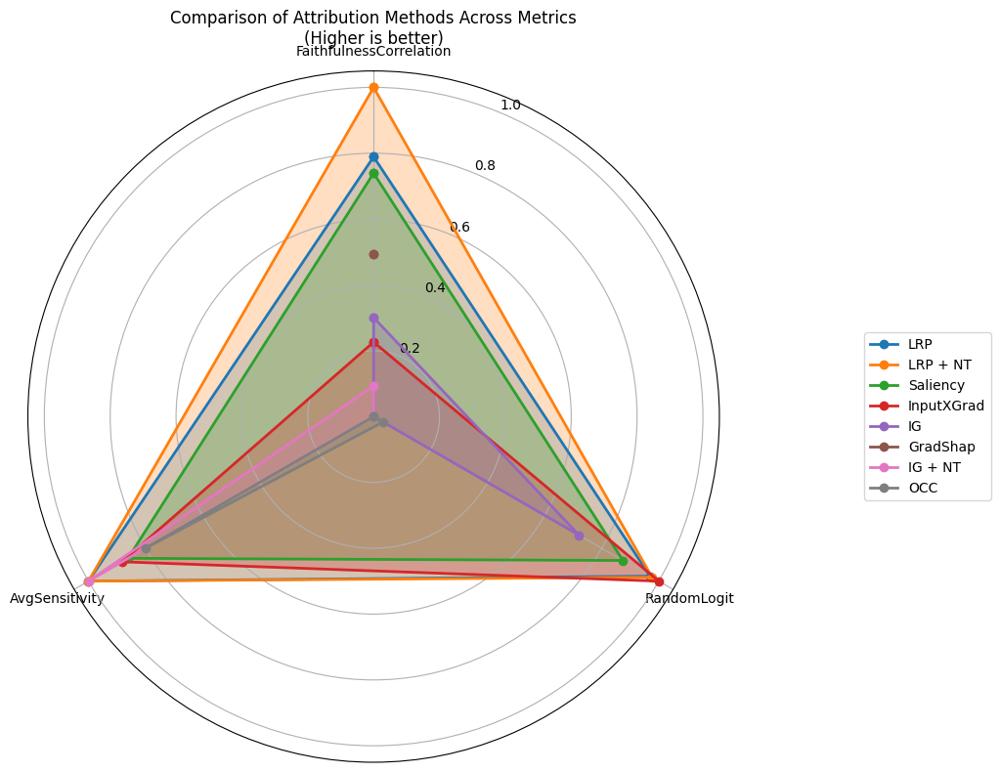

In [55]:
def plot_attribution_comparison(df_normalised, figsize=(12, 8), title='Comparison of Attribution Methods Across Metrics'):
    """
    Create a spider/radar plot to compare different attribution methods across metrics.

    Parameters:
    -----------
    df_normalised : pandas.DataFrame
        Normalized dataframe where:
        - index: metrics
        - columns: attribution methods
        - values: normalized scores (higher is better)
    figsize : tuple, optional
        Figure size in inches (width, height)
    title : str, optional
        Plot title

    Returns:
    --------
    fig, ax : tuple
        Matplotlib figure and axis objects
    """
    import matplotlib.pyplot as plt
    import numpy as np

    # Prepare the data
    categories = df_normalised.index
    methods = df_normalised.columns

    # Number of variables
    num_vars = len(categories)

    # Compute angle for each axis
    angles = [n / float(num_vars) * 2 * np.pi for n in range(num_vars)]
    angles += angles[:1]

    # Initialize the spider plot
    fig, ax = plt.subplots(figsize=figsize, subplot_kw=dict(projection='polar'))

    # Plot data
    for i, method in enumerate(methods):
        values_method = df_normalised[method].values.flatten()
        values_method = np.append(values_method, values_method[0])
        ax.plot(angles, values_method, 'o-', linewidth=2, label=method)
        ax.fill(angles, values_method, alpha=0.25)

    # Fix axis to go in the right order and start at 12 o'clock
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    # Draw axis lines for each angle and label
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)

    # Add legend
    plt.legend(loc='center left', bbox_to_anchor=(1.2, 0.5))

    plt.title(f'{title}\n(Higher is better)', pad=20)
    plt.tight_layout()

    return fig, ax

# Example usage:
fig, ax = plot_attribution_comparison(df_normalised_plot.T)
plt.show()

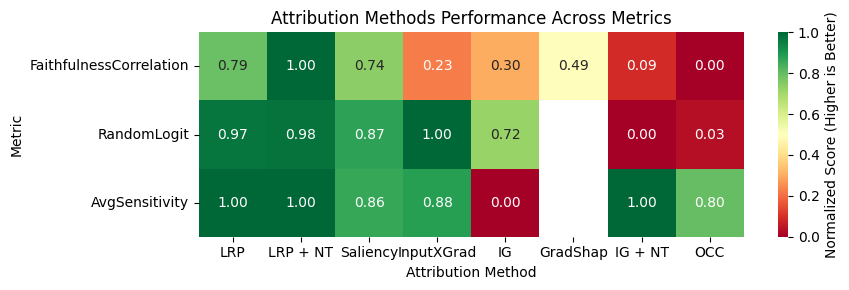

In [56]:
# Create a heatmap version
import seaborn as sns

plt.figure(figsize=(9, 3))
sns.heatmap(df_normalised_plot.T, annot=True, cmap='RdYlGn', center=0.5,
            fmt='.2f', cbar_kws={'label': 'Normalized Score (Higher is Better)'})
plt.title('Attribution Methods Performance Across Metrics')
plt.xlabel('Attribution Method')
plt.ylabel('Metric')
plt.tight_layout()
plt.show()